<a href="https://colab.research.google.com/github/Aine449/AI-ML-class-project/blob/main/sea_turtle_encoder_decoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


## Connect to your personal Google Drive folders

In [ ]:
!unzip -qq '/content/drive/MyDrive/Capstone project/IMAGES_512.zip'


## Install Packages

In [ ]:
%%capture

# Yes, this is the same NLP transfomers package where Bert lives.

! pip install transformers

In [ ]:
%%capture

# There was an error in the latest issue of albumemtations.
# To fix this error I'm using an older version.

! pip install albumentations==0.4.6

In [ ]:
# We'll be using the excellent segmentation-models-pytorch package
# created by Pavel Yakubovsky.
# https://github.com/qubvel/segmentation_models.pytorch

# More info on using this package is available here:
# https://www.kaggle.com/c/severstal-steel-defect-detection/discussion/103367#latest-595453

%%capture

! pip install segmentation-models-pytorch

In [ ]:
import pandas as pd
import numpy as np
import os


import cv2
import time
import shutil

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import torchvision
import torchvision.transforms as transforms

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

from torch.utils.data import Dataset, DataLoader

#from tqdm import tqdm

# The usual tqdm doesn't work well in colab.
# This is the solution:
# https://stackoverflow.com/questions/41707229/tqdm-printing-to-newline
import tqdm.notebook as tq
# for i in tq.tqdm(...):

import gc

import albumentations as albu
from albumentations import Compose

from sklearn import model_selection
from sklearn.utils import shuffle
from skimage import measure

import transformers
from transformers import AdamW
from transformers import get_linear_schedule_with_warmup

import segmentation_models_pytorch as smp
from segmentation_models_pytorch.encoders import get_preprocessing_fn

import matplotlib.pyplot as plt
%matplotlib inline

# Don't Show Warning Messages
import warnings
warnings.filterwarnings('ignore')

# Note: Pytorch uses a channels-first format:
# [batch_size, num_channels, height, width]

print(torch.__version__)
print(torchvision.__version__)

2.2.1+cu121
0.17.1+cu121


In [ ]:
# Set the seed values

import random

# Set the seed value all over the place to make this reproducible.
seed_val = 1023

random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

In [ ]:
image_path = '/content/IMAGES_512/'

In [ ]:
os.listdir(image_path)

In [ ]:
# Select a backbone.
# The data pre-processing to suit this backbone
# will be done automatically below.
# This allows you to quickly test multiple models without
# changing the code.
BACKBONE = 'densenet161'

NUM_FOLDS = 5
NUM_FOLDS_TO_TRAIN = 1 # Train only on one of the 5 folds.
NUM_EPOCHS = 50

IMAGE_SIZE = 256

PATIENCE = 5
L_RATE = 0.0001
BATCH_SIZE = 8

# The number of CPU cores affects the speed of the Pytorch dataloader.
# We will be using multiple cores to speed up training.
NUM_CORES = os.cpu_count()

# Using too many cores can slow down training when using
# multiple GPUs.
# Therefore, when training on multiple GPUs set NUM_CORES
# to approx. 4.

if torch.cuda.device_count() > 1:
    NUM_CORES = 4

NUM_CORES

2

## Define the device

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(device)

# Check what type of GPU Colab has assigned.
# If you get an old K80 GPU try setting the runtime to 'None' and
# then restarting the notebook. Then set the runtime to 'GPU' again.
# You might get a faster P100 or T4 GPU.
if torch.cuda.is_available():
    print('Num GPUs:', torch.cuda.device_count())
    print('GPU Type:', torch.cuda.get_device_name(0))


cuda:0
Num GPUs: 1
GPU Type: Tesla T4


## Load the train data

In [ ]:
path = '/content/drive/MyDrive/Capstone/Train.csv'
df_data = pd.read_csv(path)

print(df_data.shape)

df_data.head()

(1326, 5)


,Image_ID,x,y,w,h
0,04FB1B33,0.481988,0.506076,0.174696,0.405671
1,B04E481E,0.617405,0.313368,0.177734,0.293113
2,32655645,0.490885,0.465856,0.165582,0.357350
3,44D4DA7C,0.472873,0.506076,0.237847,0.409722
4,4F36EF72,0.433811,0.574363,0.180773,0.397569


In [ ]:
# Add the image height column

train_list = list(df_data['Image_ID'])

h_list = []
w_list = []

for item in train_list:

    path = image_path + item + '.JPG'

    image = plt.imread(path)

    # get the height and width
    h = image.shape[0]
    w = image.shape[1]

    h_list.append(h)
    w_list.append(w)


df_data['height'] = h_list
df_data['width'] = w_list

df_data.head()

,Image_ID,x,y,w,h,height,width
0,04FB1B33,0.481988,0.506076,0.174696,0.405671,384,512
1,B04E481E,0.617405,0.313368,0.177734,0.293113,384,512
2,32655645,0.490885,0.465856,0.165582,0.357350,384,512
3,44D4DA7C,0.472873,0.506076,0.237847,0.409722,384,512
4,4F36EF72,0.433811,0.574363,0.180773,0.397569,384,512


## Load the test data

In [ ]:
path = base_path + 'SampleSubmission.csv'
df_test = pd.read_csv(path)

print(df_test.shape)

df_test.head()

(695, 5)


,Image_ID,x,y,w,h
0,4863D911,0.15,0.24,0.61,0.61
1,6DD3ADD5,0.30,0.32,0.43,0.47
2,E8DC4D6A,0.35,0.52,0.47,0.47
3,E02ABB6C,0.32,0.51,0.46,0.45
4,875C19F4,0.36,0.42,0.45,0.47


## Helper Functions

In [ ]:

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform

    Args:
        preprocessing_fn (callbale): data normalization function
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose

    """

    _transform = [
        albu.Lambda(image=preprocessing_fn),
    ]
    return albu.Compose(_transform)

In [ ]:
def display_preds(df, thresh_preds):

    # set up the canvas for the subplots
    plt.figure(figsize=(20,70))


    for i in range(1,13):

        index = i

        # Load an image
        path = image_path + df.loc[index, 'Image_ID'] + '.JPG'
        image = plt.imread(path)
        image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

        # Pred mask
        pred_mask = thresh_preds[index]
        pred_mask = pred_mask.squeeze()


        plt.subplot(10,3,i)

        plt.imshow(image)
        plt.imshow(pred_mask, cmap='ocean', alpha=0.3)
        #plt.axis('off')

In [ ]:
def convert_seg_to_bbox(df, index):

    """
    Converts a predicted turtle image segmentation in a bounding box by
    using connected components.

    Output: x, y, w, h of bounding box.

    """

    # read the original image
    path = image_path + df_test.loc[index, 'Image_ID'] + '.JPG'
    image = plt.imread(path)

    # get the height and width of the image
    image_h = image.shape[0]
    image_w = image.shape[1]

    # get the predicted mask
    pred_mask = thresh_preds[index,:,:,:].copy()

    # remove the channel dimension
    pred_mask = pred_mask.squeeze()

    # Resize the predicted mask to match the original image.
    # Remember: cv2 has format (width, height) and not
    # (height, width) like matplotlib and numpy.
    resize_mask = cv2.resize(pred_mask, (image_w, image_h))


    # Convert the segmentation into a bounding box coordinates
    # .........................................................

    # Measure
    comp = measure.label(resize_mask)

    # get a list of character regions
    region_list = measure.regionprops(comp)

    # remove small pixel areas
    regions_filtered_list = []

    for region in region_list:

        if region.area > 150:
            regions_filtered_list.append(region)



    # Bug: https://github.com/apoorva-dave/LicensePlateDetector/issues/1
    # Returning 6 values instead of 4.
    # This error can be fixed by doing the following:
    # y, x, null, y2, x2, null = region.bbox

    if len(regions_filtered_list) != 0:

        # There should only be one region on the image
        region = regions_filtered_list[0]

        # get the bbox coordinates
        y, x, y2, x2 = region.bbox

        # calculate the height and width
        h = y2 - y
        w = x2 - x

        # get the coords as percentages of the original image dimensions
        x_percent = round(x/image_w, 2)
        y_percent = round(y/image_h, 2)
        h_percent = round(h/image_h, 2)
        w_percent = round(w/image_w, 2)

    else:

        x = 0
        y = 0
        h = 0
        w = 0

        x_percent = 0
        y_percent = 0
        h_percent = 0
        w_percent = 0


    return {'actual_coords': [x, y, h, w],
           'percent_coords': [x_percent, y_percent, h_percent, w_percent]}

## Convert the train bounding box coords into masks

In [ ]:
# Any image processing that's done inside the dataloader
# is going to slow down the training speed.
# Therefore, if you want to train fast then
# do as much work as possible outside the dataloader,
# before running the training loop.

# Create a new directory to store the masks that we will create

# If the folder doesn't already exist
if os.path.isdir('masks_512_dir') != True:

    masks_512_dir = 'masks_512_dir'
    os.mkdir(masks_512_dir)

In [ ]:
for index in range(0, len(df_data)):

    image_id = df_data.loc[index, 'Image_ID']

    # Read the image using cv2.
    # We use cv2 because it's the fastest by far.
    # But be careful. Keep in mind that cv2 uses a (width, height) input format
    # instead of the (height, width) format used by matplotlib.
    # Also, cv2 reads images in BGR format by default instead of RGB.
    # If your images look blue then they have been read in BGR format.
    path = image_path + image_id + '.JPG'
    image = cv2.imread(path)

    # cv2 reads in BGR format therefore convert from BGR to RGB.
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # create a blank mask
    mask = np.zeros((image.shape[0], image.shape[1]))

    x = int(df_data.loc[index, 'x'] * image.shape[1])
    y = int(df_data.loc[index, 'y'] * image.shape[0])
    w = int(df_data.loc[index, 'w'] * image.shape[1])
    h = int(df_data.loc[index, 'h'] * image.shape[0])

    # Add the bbox mask to the blank mask created above.
    # Remember that in images the origin coord (0,0) is
    # in the top left corner and not in the botton left corner
    # like on a graph.
    mask[y:y+h, x:x+w] = 1

    # Save the mask as an image in the folder
    # that we created.
    fname = image_id + '.JPG'
    dst = os.path.join(masks_512_dir, fname)

    cv2.imwrite(dst, mask)



# Check how many files are in the new directory

file_list = os.listdir('masks_512_dir')

len(file_list)

1326

(384, 512, 3)


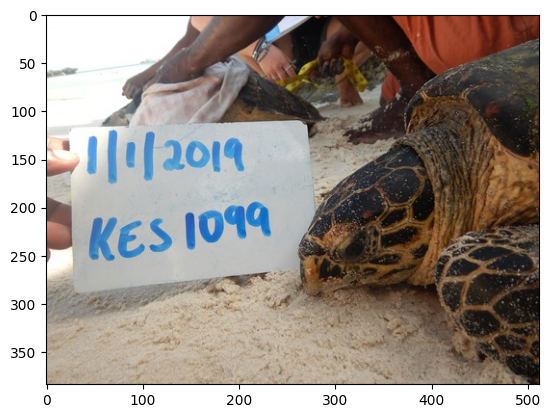

In [ ]:
# display an image

item = 7

path = image_path + df_data.loc[item, 'Image_ID'] + '.JPG'

image = plt.imread(path)

print(image.shape)

plt.imshow(image)
plt.show()

(384, 512)


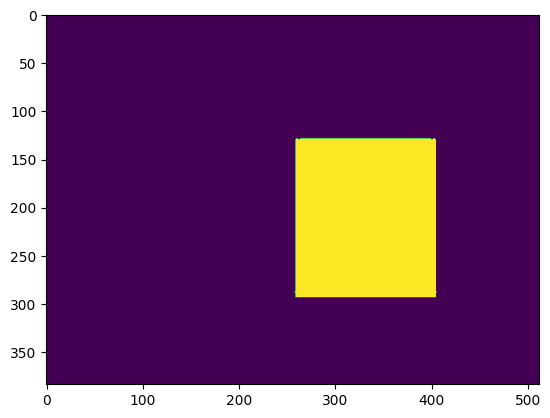

In [ ]:
# Display the corresponding mask

masks_list = os.listdir('masks_512_dir')

path = 'masks_512_dir/' + df_data.loc[item, 'Image_ID'] + '.JPG'

mask = plt.imread(path)

print(mask.shape)

plt.imshow(mask)
plt.show()

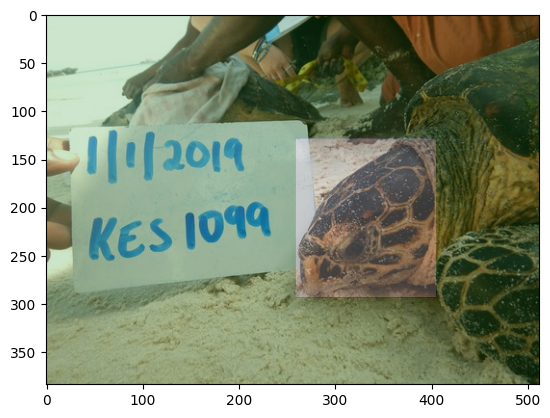

In [ ]:
# Overlay the image and mask

plt.imshow(image)
plt.imshow(mask, cmap='ocean', alpha=0.2)
plt.show()

## Set up image augmentation

In [ ]:
# The turtle heads are close to the center in every image.
# Because of this the model will try to be lazy smart and mimimize it's loss
# by simply predicting a standard size box in the same location for all images.

# To solve this problem we will use augmentation to shift the turtle heads.

In [ ]:
import albumentations as albu

# Define the augmentations

def get_training_augmentation():

    train_transform = [
    albu.HorizontalFlip(always_apply=False, p=0.5),
    albu.ShiftScaleRotate (shift_limit=0.0625, scale_limit=0.1, rotate_limit=45,
                           always_apply=False, p=0.6),
    albu.Blur(blur_limit=7, always_apply=False, p=0.3),
    albu.OneOf([
        albu.RandomContrast(),
        albu.RandomGamma(),
        #albu.RandomBrightness(), #### This is creating an error
        ], p=0.5),
    albu.OneOf([
        albu.ElasticTransform(alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
        albu.GridDistortion(),
        albu.OpticalDistortion(distort_limit=2, shift_limit=0.5),
        ], p=0.5),

    ]

    return albu.Compose(train_transform)



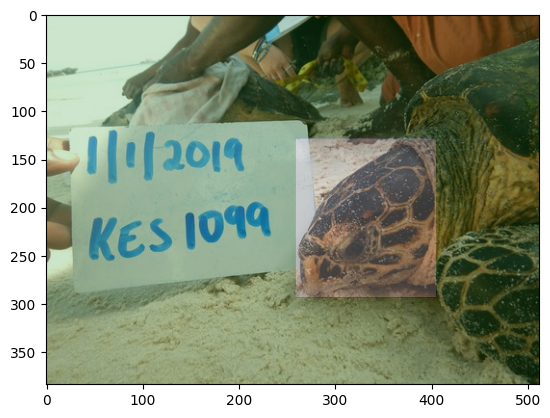

In [ ]:
# Load an image and mask

item = 7

# Load an image
path = image_path + df_data.loc[item, 'Image_ID'] + '.JPG'
image = plt.imread(path)

# Load the mask
path = '/content/masks_512_dir/' + df_data.loc[item, 'Image_ID'] + '.JPG'
mask = plt.imread(path)


plt.imshow(image)
plt.imshow(mask, cmap='ocean', alpha=0.2)
plt.show()

0
241
(384, 512, 3)
(384, 512)


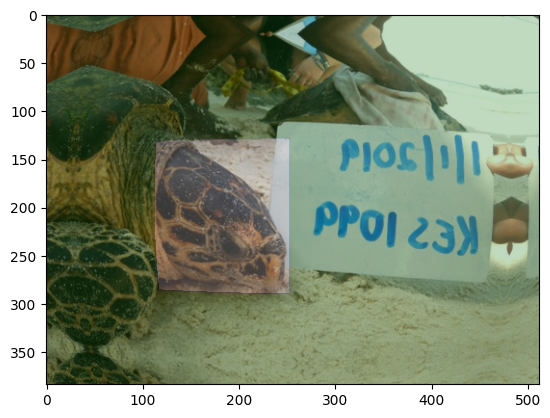

In [ ]:
# Display an AUGMENTED image

augmentation = get_training_augmentation()

# The beauty of albumentations is that the same augmentation
# is applied both to the image and to its mask.
sample = augmentation(image=image, mask=mask)
image, mask = sample['image'], sample['mask']


print(image.min())
print(image.max())

print(image.shape)
print(mask.shape)



plt.imshow(image)
plt.imshow(mask, cmap='ocean', alpha=0.2)
plt.show()

-2.083654422467677
2.3959912854030496
(384, 512, 3)
(384, 512)


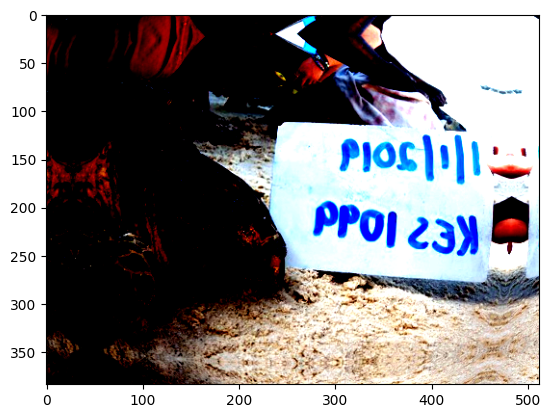

In [ ]:
# Display a PRE-PROCESSED image

from segmentation_models_pytorch.encoders import get_preprocessing_fn

# Initialize the preprocessing function
preprocessing_fn = get_preprocessing_fn(BACKBONE, pretrained='imagenet')

preprocessing = get_preprocessing(preprocessing_fn)

sample = preprocessing(image=image, mask=mask)
image, mask = sample['image'], sample['mask']

print(image.min())
print(image.max())

print(image.shape)
print(mask.shape)


plt.imshow(image)
plt.show()

## Create the folds

In [ ]:
# We will create 5 folds and stratify by image height.
# There are two different image heights in the dataset.
# We will train only using one of the 5 folds in the same
# way as one would do when using train_test_split.

In [ ]:
from sklearn.model_selection import KFold, StratifiedKFold

# shuffle
df = shuffle(df_data)

# initialize kfold
kf = StratifiedKFold(n_splits=NUM_FOLDS, shuffle=True, random_state=1024)

# for stratification
y = df['height']

# Note:
# Each fold is a tuple ([train_index_values], [val_index_values])
# fold_0, fold_1, fold_2, fold_3, fold_5 = kf.split(df, y)

# Put the folds into a list. This is a list of tuples.
fold_list = list(kf.split(df, y))

train_df_list = []
val_df_list = []

for i, fold in enumerate(fold_list):

    # map the train and val index values to dataframe rows
    df_train = df[df.index.isin(fold[0])]
    df_val = df[df.index.isin(fold[1])]

    train_df_list.append(df_train)
    val_df_list.append(df_val)


print(len(train_df_list))
print(len(val_df_list))

5
5


## Create the dataloader

In [ ]:
df_data.head()

,Image_ID,x,y,w,h,height,width
0,04FB1B33,0.481988,0.506076,0.174696,0.405671,384,512
1,B04E481E,0.617405,0.313368,0.177734,0.293113,384,512
2,32655645,0.490885,0.465856,0.165582,0.357350,384,512
3,44D4DA7C,0.472873,0.506076,0.237847,0.409722,384,512
4,4F36EF72,0.433811,0.574363,0.180773,0.397569,384,512


In [ ]:
class CompDataset(Dataset):

    def __init__(self, df, augmentation=None, preprocessing=None):
        self.df = df
        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.df)



    def __getitem__(self, index):

        #base_path = '../input/zindi-sea-turtles/'
        image_path = '/content/IMAGES_512/'

        image_id =  self.df.loc[index, 'Image_ID']

        # set the path to the image
        path = image_path + image_id + '.JPG'

        # Create the image
        # ------------------

        # read the image
        image = cv2.imread(path)

        # read the image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # resize the image
        image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

        # create a channel dimension
        #image = np.expand_dims(image, axis=-1)



        # Create the mask
        # ------------------

        # create the mask
        path = '/content/masks_512_dir/' + image_id + '.JPG'
        mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        # resize the mask
        mask = cv2.resize(mask, (IMAGE_SIZE, IMAGE_SIZE))

        # create a channel dimension
        mask = np.expand_dims(mask, axis=-1)



        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']


        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']



        # Swap color axis
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))
        mask = mask.transpose((2, 0, 1))

        # convert to torch tensor
        image = torch.tensor(image, dtype=torch.float)
        mask = torch.tensor(mask, dtype=torch.float)



        return {
                "images": image,
                "masks": mask
                }



In [ ]:
class TestDataset(Dataset):

    def __init__(self, df, preprocessing=None):
        self.df = df
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.df)



    def __getitem__(self, index):


        image_path = '/content/IMAGES_512/'

        image_id = self.df.loc[index, 'Image_ID']


        # set the path to the image
        path = image_path + image_id  + '.JPG'

        # Create the image
        # ------------------

        # read the image
        image = cv2.imread(path)

        # read the image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # resize the image
        image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, _ = sample['image'], sample['mask']

        # Swap color axis
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))

        # convert to torch tensor
        image = torch.tensor(image, dtype=torch.float)



        return {
                "images": image
                }


## Test the dataloader

In [ ]:
# Intialize the fold dataframes
fold_index = 0

df_train = train_df_list[fold_index]
df_val = val_df_list[fold_index]

In [ ]:
# Reset the indices.
# If the dataloder returns an error during training
# it's usually because the indices of the input dataframe
# have not been reset.
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)

In [ ]:
from segmentation_models_pytorch.encoders import get_preprocessing_fn

# Initialize the preprocessing function
preprocessing_fn = get_preprocessing_fn(BACKBONE, pretrained='imagenet')

# Create the dataloders.
# This is just an example.
# We will initialize the dataloaders again later.

train_data = CompDataset(df_train, augmentation=None,
                         preprocessing=get_preprocessing(preprocessing_fn))

val_data = CompDataset(df_val, augmentation=None,
                      preprocessing=get_preprocessing(preprocessing_fn))



train_dataloader = torch.utils.data.DataLoader(train_data,
                                        batch_size=BATCH_SIZE,
                                        shuffle=True,
                                       num_workers=NUM_CORES)

val_dataloader = torch.utils.data.DataLoader(val_data,
                                        batch_size=BATCH_SIZE,
                                        shuffle=False,
                                       num_workers=NUM_CORES)



print(len(train_dataloader))
print(len(val_dataloader))

133
34


In [ ]:
# Get one train batch

data = next(iter(train_dataloader))

print(data['images'].shape)
print(data['masks'].shape)

torch.Size([8, 3, 256, 256])
torch.Size([8, 1, 256, 256])


torch.Size([256, 256])


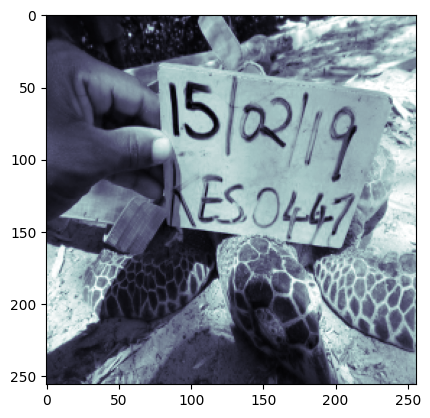

In [ ]:
images = data['images']

image = images[7]

# convert from (C, H, W) to (H, W, C) format
image = image.permute((1, 2, 0))

image = image[:, :, 0]

print(image.shape)

plt.imshow(image, cmap='bone')

plt.show()

torch.Size([1, 256, 256])
torch.Size([256, 256])


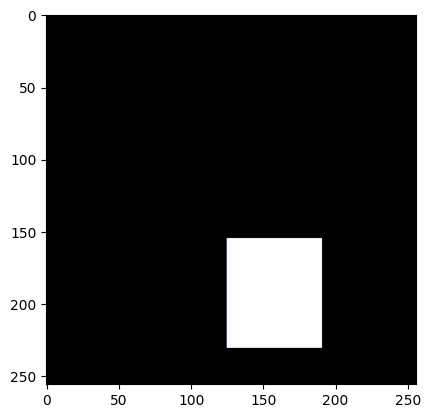

In [ ]:
masks = data['masks']

mask = masks[7]

print(mask.shape)

# convert from (C, H, W) to (H, W, C) format
mask = mask.permute((1, 2, 0))

mask = mask[:, :, 0]

print(mask.shape)

plt.imshow(mask, cmap='bone')

plt.show()

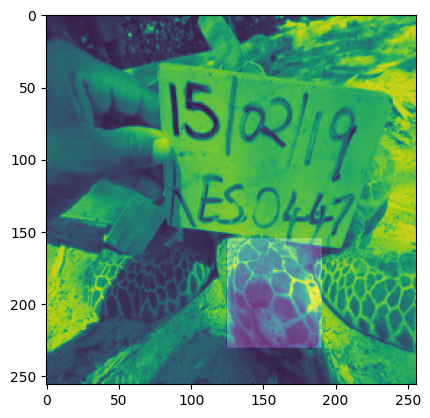

In [ ]:
plt.imshow(image)
plt.imshow(mask, cmap='ocean', alpha=0.2)
plt.show()

In [ ]:
# Get one val batch

data = next(iter(val_dataloader))

print(data['images'].shape)
print(data['masks'].shape)

torch.Size([8, 3, 256, 256])
torch.Size([8, 1, 256, 256])


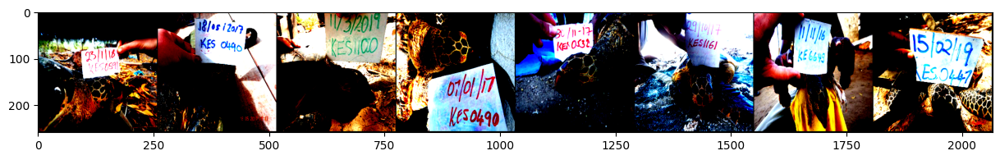

In [ ]:
# Display the image batch in a grid

grid = torchvision.utils.make_grid(images) # nrows is the number of classes

plt.figure(figsize=(15,15))
plt.imshow(np.transpose(grid, (1,2,0)))
plt.show()

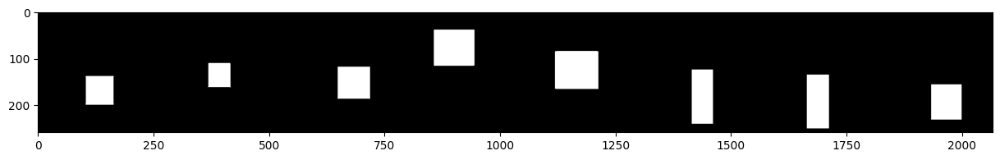

In [ ]:
# Display the mask batch in a grid

grid = torchvision.utils.make_grid(masks) # nrows is the number of classes

plt.figure(figsize=(15,15))
plt.imshow(np.transpose(grid, (1,2,0)))
plt.show()

## Define the Model

In [ ]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [ ]:
# This is just an example to help us test that everything works.
# We will define the model again later inside the model_fn().

In [ ]:
# (1) Segmentation Model
# .......................

# seg_model Input:
# 3x256x256 RGB pre-processed image

# seg_model Output:
# Mask with float values in range 0 to 1


ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid'

# create segmentation model with pretrained encoder
model = smp.FPN(
    encoder_name=BACKBONE,
    encoder_weights=ENCODER_WEIGHTS,
    classes=1,
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(BACKBONE, ENCODER_WEIGHTS)

# print(model)

Downloading: "http://data.lip6.fr/cadene/pretrainedmodels/densenet161-347e6b360.pth" to /root/.cache/torch/hub/checkpoints/densenet161-347e6b360.pth
100%|██████████| 110M/110M [05:25<00:00, 356kB/s]


## Test the model

In [ ]:
# Create an input batch

data = next(iter(train_dataloader))

print(data['images'].shape)
print(data['masks'].shape)

torch.Size([8, 3, 256, 256])
torch.Size([8, 1, 256, 256])


In [ ]:
model.eval()

images = data['images']
targets = data['masks']

# pass the images into the model
outputs = model(images)


print(outputs.shape)
print(targets.shape)

torch.Size([8, 1, 256, 256])
torch.Size([8, 1, 256, 256])


In [ ]:
outputs[0]

tensor([[[0.0814, 0.1185, 0.1695,  ..., 0.0959, 0.1351, 0.1870],
         [0.0589, 0.0836, 0.1172,  ..., 0.0660, 0.0912, 0.1247],
         [0.0424, 0.0582, 0.0794,  ..., 0.0449, 0.0605, 0.0810],
         ...,
         [0.0126, 0.0109, 0.0094,  ..., 0.1147, 0.1214, 0.1285],
         [0.0130, 0.0119, 0.0109,  ..., 0.1327, 0.1358, 0.1390],
         [0.0134, 0.0129, 0.0125,  ..., 0.1530, 0.1516, 0.1503]]])

In [ ]:
targets[0]

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
# Calculate the loss

def loss_fn(outputs, targets):

    loss = smp.losses.DiceLoss(mode = 'binary')
    output = loss(outputs, targets)

    return output

loss = loss_fn(outputs, targets)

loss.item()

0.855532169342041

# Engine - Training and Evaluation

In [ ]:
# Define the loss

def loss_fn(outputs, targets):

    loss = smp.losses.DiceLoss(mode = 'binary')
    output = loss(outputs, targets)

    return output


In [ ]:
# Define the metric

def calculate_iou(y_true, y_pred):

    """
    Input: Numpy arrays with shape (image_h, image_w)
    Output: IOU value as a number.

    This works only for single images and not
    for a batch of images.
    """

    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    result = (y_true_flat * y_pred_flat)

    area_of_intersection = np.sum(result)

    area_of_union = (np.sum(y_true_flat) + np.sum(y_pred_flat)) - area_of_intersection

    # add 0.00001 to prevent a zero division error.
    IOU = (area_of_intersection)/(area_of_union + 0.00001)

    return IOU



def metric_fn(df, outputs, targets):

    torch_outputs = torch.tensor(outputs)
    torch_targets = torch.tensor(targets)

    # This is for when the sigmoid activation
    # is not part of a model and has to be done separately.
    #sigmoid = torch.nn.Sigmoid()
    #pred_probas = sigmoid(torch_outputs)

    targets = torch_targets.detach().numpy()
    pred_probas = torch_outputs.detach().numpy()

    # Threshold the predictions
    thresh_preds = (pred_probas >= 0.5).astype(np.uint8)

    score_list = []

    for index in range(0, len(df_val)):

        path = image_path + df.loc[index, 'Image_ID'] + '.JPG'
        image = plt.imread(path)

        path = '/content/masks_512_dir/' + df.loc[index, 'Image_ID'] + '.JPG'
        true_mask = plt.imread(path)

        true_mask = cv2.resize(true_mask, (image.shape[1], image.shape[0]))

        # add the bbox mask to the blank mask created above
        pred_mask = thresh_preds[index]

        pred_mask = pred_mask.squeeze()

        pred_mask = cv2.resize(pred_mask, (image.shape[1], image.shape[0]))

        iou = calculate_iou(pred_mask, true_mask)

        score_list.append(iou)

    return np.mean(score_list)

In [ ]:
# Define the train function


def train_fn(df, model, optimizer, device, scheduler):

    data = CompDataset(df, augmentation=get_training_augmentation(),
                       preprocessing=get_preprocessing(preprocessing_fn))
    #data = CompDataset(df, augmentation=get_training_augmentation())

    data_loader = torch.utils.data.DataLoader(data,
                                            batch_size=BATCH_SIZE,
                                            shuffle=True,
                                           num_workers=NUM_CORES)

    model.train()

    # This turns gradient calculations on and off.
    torch.set_grad_enabled(True)

    fin_targets = []


    for i, data in tq.tqdm(enumerate(data_loader), total=len(data_loader)):

        images = data['images']
        targets = data['masks']


        images = images.to(device, dtype=torch.float)
        targets = targets.to(device, dtype=torch.float)

        optimizer.zero_grad()

        outputs = model(images)


        loss = loss_fn(outputs, targets)
        loss.backward()

        optimizer.step()

        scheduler.step()


        # convert to numpy so we can stack the batches.
        outputs = outputs.cpu().detach().numpy()
        targets = targets.cpu().detach().numpy()

        # stack the preds and targets from each batch
        if i == 0:
            fin_outputs = outputs
            fin_targets = targets
        else:
            fin_outputs = np.vstack((fin_outputs, outputs))
            fin_targets = np.vstack((fin_targets, targets))



    return fin_outputs, fin_targets


In [ ]:
# Define the val function

def eval_fn(df, model, device):

    data = CompDataset(df, augmentation=None,
                       preprocessing=get_preprocessing(preprocessing_fn))

    data_loader = torch.utils.data.DataLoader(data,
                                            batch_size=BATCH_SIZE,
                                            shuffle=False,
                                           num_workers=1)

    model.eval()

    # This turns gradient calculations on and off.
    torch.set_grad_enabled(False)

    fin_targets = []


    for i, data in tq.tqdm(enumerate(data_loader), total=len(data_loader)):

        images = data['images']
        targets = data['masks']


        images = images.to(device, dtype=torch.float)
        targets = targets.to(device, dtype=torch.float)


        outputs = model(images)

        # convert to numpy so we can stack the batches.
        outputs = outputs.cpu().detach().numpy()
        targets = targets.cpu().detach().numpy()

        # stack the preds from each batch
        # stack the preds and targets from each batch
        if i == 0:
            fin_outputs = outputs
            fin_targets = targets
        else:
            fin_outputs = np.vstack((fin_outputs, outputs))
            fin_targets = np.vstack((fin_targets, targets))


    return fin_outputs, fin_targets

In [ ]:
# Define the inference function

def inference_fn(df, model, device):

    data = TestDataset(df,
                       preprocessing=get_preprocessing(preprocessing_fn))

    data_loader = torch.utils.data.DataLoader(data,
                                            batch_size=BATCH_SIZE,
                                            shuffle=False,
                                           num_workers=1)

    model.eval()

    # This turns gradient calculations on and off.
    torch.set_grad_enabled(False)



    for i, data in tq.tqdm(enumerate(data_loader), total=len(data_loader)):

        images = data['images']

        images = images.to(device, dtype=torch.float)


        outputs = model(images)

        # convert to numpy so we can stack the batches.
        outputs = outputs.cpu().detach().numpy()

        # stack the preds from each batch
        if i == 0:
            fin_outputs = outputs
        else:
            fin_outputs = np.vstack((fin_outputs, outputs))



    return fin_outputs

In [ ]:
# Define the model, optimizer and scheduler

def model_fn(df_train):

    ENCODER_WEIGHTS = 'imagenet'
    ACTIVATION = 'sigmoid'

    # create segmentation model with pretrained encoder
    model = smp.FPN(
        encoder_name=BACKBONE,
        encoder_weights=ENCODER_WEIGHTS,
        classes=1,
        activation=ACTIVATION
        )


    num_train_steps = int(len(df_train) / BATCH_SIZE * NUM_EPOCHS)

    optimizer = torch.optim.Adam(model.parameters(), lr=L_RATE)

    scheduler = get_linear_schedule_with_warmup(
        optimizer, num_warmup_steps=0, num_training_steps=num_train_steps)


    return model, optimizer, scheduler

## Training

In [ ]:
# This setup is designed for 5 fold cross validation but
# here we will only train on one fold.
%%time
fold_train_scores_list = []
fold_val_scores_list = []
val_preds_list = []
val_targets_list = []
test_preds_list = []



# reset the index
df_test = df_test.reset_index(drop=True)


# For each fold...
for fold_index in range(0, NUM_FOLDS_TO_TRAIN):

    print('\n== Fold Model', fold_index)


    # Get df_train and df_val
    # ........................

    # Intialize the fold dataframes
    df_train = train_df_list[fold_index]
    df_val = val_df_list[fold_index]


    # Reset the indices or the dataloader won't work.
    df_train = df_train.reset_index(drop=True)
    df_val = df_val.reset_index(drop=True)


    model, optimizer, scheduler = model_fn(df_train)
    model.to(device)



    # Training for the specified number of epochs
    # ............................................

    best_score = 0 # best IOU score is 1.0
    early_stopping_count = 0

    for epoch in range(0, NUM_EPOCHS):

        # Train the model.
        train_outputs, train_targets = train_fn(df_train, model, optimizer, device, scheduler)

        # Use the trained model to predict on the val set.
        # Generate a dictionary of outputs.
        val_outputs, val_targets = eval_fn(df_val, model, device)


        print('Epoch', epoch)

        # Calculate the train score

        score = metric_fn(df_train, train_outputs, train_targets)

        print(f"Train avg IOU Score = {score}")


        # Calculate the val score

        score = metric_fn(df_val, val_outputs, val_targets)

        print(f"Val avg IOU Score = {score}")


        # Save the model

        path_model = str(fold_index) + '_model.bin'

        if epoch == 0:
            torch.save(model.state_dict(), path_model)
            print('Model saved:', path_model)

            early_stopping_count = 0

        if score > best_score:
            torch.save(model.state_dict(), path_model)
            print('Val score improved. Model saved:', path_model)
            best_score = score

            early_stopping_count = 0

        else:
            early_stopping_count = early_stopping_count + 1

        if early_stopping_count > PATIENCE:
            # Stop the loop.
            # Move to the next fold when doing cross validaton.
            print('\n *** Early stopping. ***')
            break

        print('\n')



== Fold Model 0


  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 0
Train avg IOU Score = 0.202183890145319
Val avg IOU Score = 0.7077671586378625
Model saved: 0_model.bin
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 1
Train avg IOU Score = 0.21729161583717246
Val avg IOU Score = 0.7355262876222288
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 2
Train avg IOU Score = 0.21227962952860152
Val avg IOU Score = 0.7146690567008254




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 3
Train avg IOU Score = 0.22335790753837173
Val avg IOU Score = 0.7079005653591532




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 4
Train avg IOU Score = 0.20757292884068135
Val avg IOU Score = 0.740577651466187
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 5
Train avg IOU Score = 0.22261930843409478
Val avg IOU Score = 0.7513751385149322
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 6
Train avg IOU Score = 0.23364632754437006
Val avg IOU Score = 0.7622421150062951
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 7
Train avg IOU Score = 0.20384459608998673
Val avg IOU Score = 0.7783926544744563
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 8
Train avg IOU Score = 0.21567505456357305
Val avg IOU Score = 0.7851489817645302
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 9
Train avg IOU Score = 0.22032939545565686
Val avg IOU Score = 0.8014858832341134
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 10
Train avg IOU Score = 0.18934626932686777
Val avg IOU Score = 0.7567773455688216




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 11
Train avg IOU Score = 0.1996751638270306
Val avg IOU Score = 0.7962961798492543




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 12
Train avg IOU Score = 0.21208877826318354
Val avg IOU Score = 0.8029555664616455
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 13
Train avg IOU Score = 0.20101210677350648
Val avg IOU Score = 0.777474147233359




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 14
Train avg IOU Score = 0.1991385727127003
Val avg IOU Score = 0.7831746922815487




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 15
Train avg IOU Score = 0.2163300511829103
Val avg IOU Score = 0.8029703471647406
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 16
Train avg IOU Score = 0.1920413121032598
Val avg IOU Score = 0.7981107538650489




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 17
Train avg IOU Score = 0.20777054430135422
Val avg IOU Score = 0.8246254618425293
Val score improved. Model saved: 0_model.bin




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 18
Train avg IOU Score = 0.22443413871445708
Val avg IOU Score = 0.8161784679118386




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 19
Train avg IOU Score = 0.20513485729661762
Val avg IOU Score = 0.7925803339218569




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 20
Train avg IOU Score = 0.22482727466625524
Val avg IOU Score = 0.7973108797653192




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 21
Train avg IOU Score = 0.2112522402065826
Val avg IOU Score = 0.7985384657022003




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 22
Train avg IOU Score = 0.20937763299032613
Val avg IOU Score = 0.8100823234034247




  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch 23
Train avg IOU Score = 0.20503992337796745
Val avg IOU Score = 0.8195433520282654

 *** Early stopping. ***
CPU times: user 17min 58s, sys: 4min 13s, total: 22min 11s
Wall time: 24min 49s


## Load the best model

In [ ]:
path_model = '0_model.bin'

model.load_state_dict(torch.load(path_model))
model.to(device)

FPN(
  (encoder): DenseNetEncoder(
    (features): Sequential(
      (conv0): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (norm0): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu0): ReLU(inplace=True)
      (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (denseblock1): _DenseBlock(
        (denselayer1): _DenseLayer(
          (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu1): ReLU(inplace=True)
          (conv1): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (norm2): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu2): ReLU(inplace=True)
          (conv2): Conv2d(192, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (denselayer2): _DenseLayer(
          (norm1): BatchNorm2d(144, eps=1e-05, momentum

## Make a prediction on the val set

In [ ]:
val_preds = inference_fn(df_val, model, device)

val_preds.shape

  0%|          | 0/34 [00:00<?, ?it/s]

(266, 1, 256, 256)

In [ ]:
# Threshold the predictions so that
# all values are either 0 or 1.

# Threshold the predictions
thresh_preds = (val_preds >= 0.5).astype(np.uint8)

thresh_preds.shape

(266, 1, 256, 256)

In [ ]:
print(thresh_preds.min())
print(thresh_preds.max())

0
1


In [ ]:
score_list = []

for index in range(0, len(df_val)):

    path = image_path + df_val.loc[index, 'Image_ID'] + '.JPG'
    image = plt.imread(path)

    path = 'masks_512_dir/' + df_val.loc[index, 'Image_ID'] + '.JPG'
    true_mask = plt.imread(path)

    true_mask = cv2.resize(true_mask, (256, 256))

    # add the bbox mask to the blank mask created above
    pred_mask = thresh_preds[index]

    pred_mask = pred_mask.squeeze()

    pred_mask = pred_mask.astype('int')
    true_mask = true_mask.astype('int')

    jac = calculate_iou(pred_mask, true_mask)

    score_list.append(jac)

# add the iou scores for each image to the val dataframe.
df_val['thresh_iou_score'] = score_list

df_val.head()

,Image_ID,x,y,w,h,height,width,thresh_iou_score
0,2200EA3A,0.471354,0.147569,0.432509,0.403067,384,512,0.711852
1,C3D2C3FA,0.454750,0.221667,0.470000,0.399667,384,512,0.849623
2,C85C5669,0.240757,0.347418,0.240317,0.409038,384,512,0.824827
3,B29A6B5A,0.371528,0.447421,0.137153,0.249339,384,512,0.741729
4,F19F7276,0.227500,0.602333,0.376000,0.290333,384,512,0.894644


In [ ]:
# Get a quick overview of the model's val performance

mean_val_iou = df_val['thresh_iou_score'].mean()
min_val_iou = df_val['thresh_iou_score'].min()
max_val_iou = df_val['thresh_iou_score'].max()

print('Mean val iou:', mean_val_iou)
print('Min val iou:', min_val_iou)
print('Max val iou:', max_val_iou)

Mean val iou: 0.8229379533813109
Min val iou: 0.5721392999245069
Max val iou: 0.9470716926341839


In [ ]:
# Save the val dataframe as a compressed csv file.
# The compressed format is useful when saving
# big dataframes that use a lot of disk memory.
# Saving will allow us to analyze the val iou results later
# in another notebook without having to train the model again.

path = '/content/drive/My Drive/' + 'Capstone' + '/df_val.csv.gz'

df_val.to_csv(path, compression='gzip', index=False)

# This is how to load this saved dataframe.
# No need to uncompress it. Pandas can read compressed csv files.
# df_val = pd.read_csv('df_val.csv.gz')

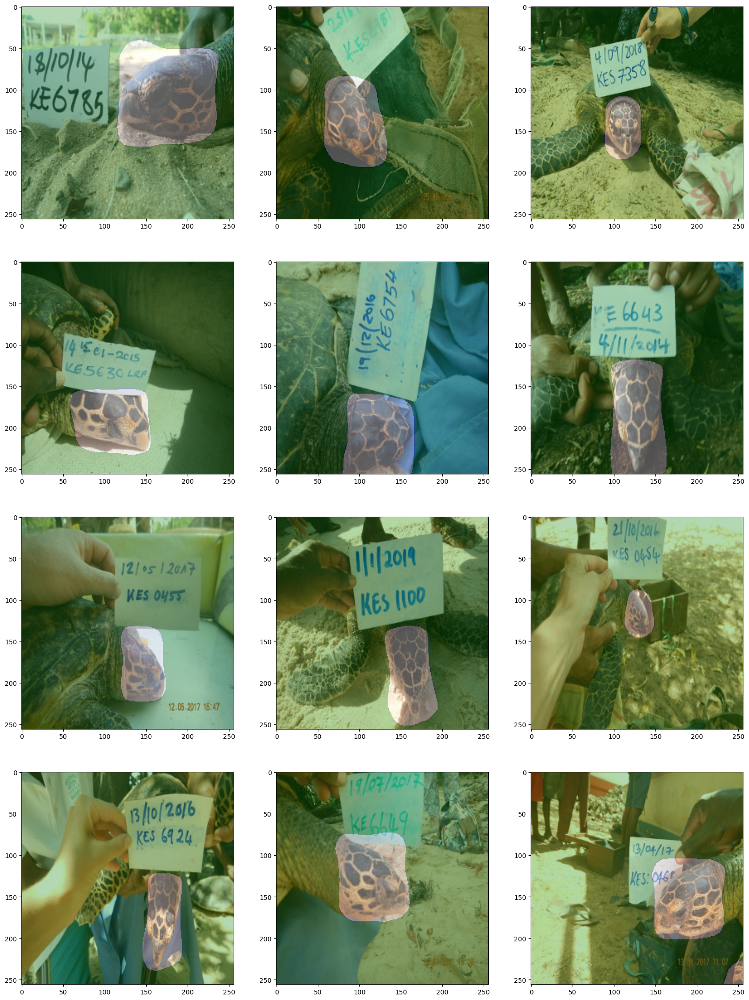

In [ ]:
# Display the raw val predictions.

# You will note that even tho we gave the model a
# bounding box mask as a target it still produced an output
# that's close to being a segmentation. Althouth far from perfect, the model has
# learned to follow the contours of a turtles head.
# This is a magic ability that Unet has that I've
# also seen on past projects.


# Later we will use sklearn connected components to
# convert these segmentations into bounding boxes
# for the competition submission.

display_preds(df_val, thresh_preds)

## Make a prediction on the test set

In [ ]:
test_preds = inference_fn(df_test, model, device)

test_preds.shape

  0%|          | 0/87 [00:00<?, ?it/s]

(695, 1, 256, 256)

In [ ]:
test_preds.max()

1.0

In [ ]:
# Threshold the raw predictions

# Threshold the predictions
thresh_preds = (test_preds >= 0.5).astype(np.uint8)

thresh_preds.shape

(695, 1, 256, 256)

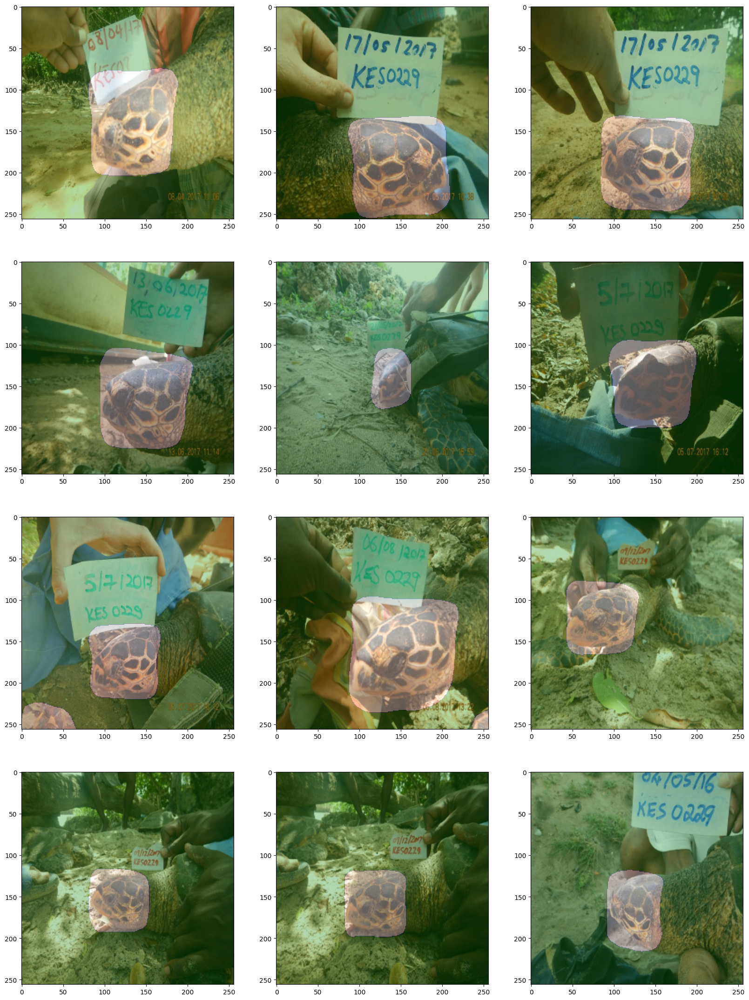

In [ ]:
# Display the predictions

display_preds(df_test, thresh_preds)

## Convert the test preds into bounding boxes

In [ ]:
path = base_path + 'SampleSubmission.csv'
df_sample= pd.read_csv(path)

print(df_sample.shape)

df_sample.head()

(695, 5)


,Image_ID,x,y,w,h
0,4863D911,0.15,0.24,0.61,0.61
1,6DD3ADD5,0.30,0.32,0.43,0.47
2,E8DC4D6A,0.35,0.52,0.47,0.47
3,E02ABB6C,0.32,0.51,0.46,0.45
4,875C19F4,0.36,0.42,0.45,0.47


In [ ]:
thresh_preds.shape

(695, 1, 256, 256)

In [ ]:
x_list = []
y_list = []
h_list = []
w_list = []

for i in range(0, len(df_test)):

    # Convert the predicted masks into bounding boxes and
    # get the bbox coordinates.
    data = convert_seg_to_bbox(df_test, i)

    # get the percent coords
    x, y, h, w = data['percent_coords']

    x_list.append(x)
    y_list.append(y)
    h_list.append(h)
    w_list.append(w)



# Add the percent coords to df_sample

df_sample['x'] = x_list
df_sample['y'] = y_list
df_sample['h'] = h_list
df_sample['w'] = w_list

print(df_sample.shape)

df_sample.head()

(695, 5)


,Image_ID,x,y,w,h
0,4863D911,0.16,0.25,0.61,0.61
1,6DD3ADD5,0.32,0.29,0.42,0.51
2,E8DC4D6A,0.34,0.52,0.48,0.48
3,E02ABB6C,0.33,0.51,0.44,0.46
4,875C19F4,0.37,0.41,0.44,0.48


## Create a submission csv file

In [ ]:
# Create a submission csv file
path = base_path + 'SampleSubmission.csv'
df_sample.to_csv(path, index=False)

In [ ]:
# Create a requirements.txt file

!pip freeze > requirements.txt

In [ ]:
!ls

0_model.bin  drive  IMAGES_512	masks_512_dir  requirements.txt  sample_data


In [ ]:
# Save the trained model to your google drive

path_model = '/content/drive/My Drive/' + 'Capstone' + '/0_model.bin'

torch.save(model.state_dict(), path_model)
print('Model saved:', path_model)

Model saved: /content/drive/My Drive/Capstone/0_model.bin


In [ ]:
# This step is useful when committing this notebook on Kaggle.
# Delete the masks directory to prevent a Kaggle error.
# Kaggle allows a max of 500 files to be saved.

# Uncomment these two lines line before committing this notebook on Kaggle.
#if os.path.isdir('masks_512_dir') == True:
    #shutil.rmtree('masks_512_dir')

## References and Resources

- Notebook by Jonne where I first saw the segmentation plus connected components approach used: <br>
https://www.kaggle.com/jonnedtc/cnn-segmentation-connected-components

- Video on the encoder decoder network architecture, by Computerphile:<br>
https://www.youtube.com/watch?v=1icvxbAoPWc

- Segmentation models package by qubvel:<br>
https://github.com/qubvel/segmentation_models.pytorch

- Notes on using the segmentation models package by Chris Deotte: <br>
https://www.kaggle.com/c/severstal-steel-defect-detection/discussion/103367#latest-595453

- Basic image techniques by vbookshelf: <br>
https://www.kaggle.com/vbookshelf/how-to-generate-artificial-cell-images

- Video tutorial series to learn Pytorch, by deeplizard:<br>
https://deeplizard.com/learn/video/v5cngxo4mIg

- U-Net Paper<br>
U-Net: Convolutional Networks for Biomedical Image Segmentation<br>
https://arxiv.org/abs/1505.04597

- MobileNet paper<br>
MobileNets: Efficient Convolutional Neural Networks for Mobile Vision Applications<br>
https://arxiv.org/abs/1704.04861

- IOU metric explanation:<br>
https://medium.com/datadriveninvestor/deep-learning-in-medical-imaging-3c1008431aaf

In [ ]:
# densenet161, smp.FPN, zindi-score 0.765421418

In [ ]:
# densenet161, smp.FPN, zindi-score 0.748176356 Mean val iou: 0.8229379533813109
# Min val iou: 0.5721392999245069
# Max val iou: 0.9470716926341839